# Notebook d'exploration des données OLIST

# Chargement des données

In [1]:
import sqlite3
import pandas as pd
from skimpy import skim
import missingno as msno
import plotly.express as px

%matplotlib inline

# Chemin vers votre fichier .db
DB_PATH = '../data/olist.db'

# Connexion à la base de données
conn = sqlite3.connect(DB_PATH)

# Etude des liens entre les tables et créations des dataframes

Pour étudier toutes les tables, il est crucial d'identifier les clés primaires et étrangères qui relient les tables entre elles. Voici les liens entre les différentes tables :

| Table 1     | Table 2       | Relation                                      |
|-------------|---------------|----------------------------------------------|
| **orders**  | **customers** | `orders.customer_id` ↔ `customers.customer_id` |
| **orders**  | **order_items**| `orders.order_id` ↔ `order_items.order_id`   |
| **orders**  | **order_reviews**| `orders.order_id` ↔ `order_reviews.order_id` |
| **order_items**| **products**  | `order_items.product_id` ↔ `products.product_id` |
| **order_items**| **sellers**   | `order_items.seller_id` ↔ `sellers.seller_id`   |
| **products**| **translation**| `products.product_category_name` ↔ `translation.product_category_name` |
| **customers**| **geoloc**     | `customers.customer_zip_code_prefix` ↔ `geoloc.geolocation_zip_code_prefix` |
| **sellers** | **geoloc**     | `sellers.seller_zip_code_prefix` ↔ `geoloc.geolocation_zip_code_prefix` |

In [2]:
# Chargement des tables dans des DataFrames
orders = pd.read_sql_query("SELECT * FROM orders", conn, index_col='index')
customers = pd.read_sql_query("SELECT * FROM customers", conn, index_col='index')
order_items = pd.read_sql_query("SELECT * FROM order_items", conn, index_col='index')
order_reviews = pd.read_sql_query("SELECT * FROM order_reviews", conn, index_col='index')
order_pymts = pd.read_sql_query("SELECT * FROM order_pymts", conn, index_col='index')
products = pd.read_sql_query("SELECT * FROM products", conn, index_col='index')
sellers = pd.read_sql_query("SELECT * FROM sellers", conn, index_col='index')
translation = pd.read_sql_query("SELECT * FROM translation", conn, index_col='index')
geoloc = pd.read_sql_query("SELECT * FROM geoloc", conn, index_col='index')

# Fermer la connexion avec la bdd
conn.close()

# Exploration des données

### orders

In [3]:
orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
index,,,,,,,,
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [4]:
orders.describe()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
count,99441,99441,99441,99441,99281,97658,96476,99441
unique,99441,99441,8,98875,90733,81018,95664,459
top,66dea50a8b16d9b4dee7af250b4be1a5,edb027a75a1449115f6b43211ae02a24,delivered,2018-08-02 12:05:26,2018-02-27 04:31:10,2018-05-09 15:48:00,2018-05-08 19:36:48,2017-12-20 00:00:00
freq,1,1,96478,3,9,47,3,522


<Axes: >

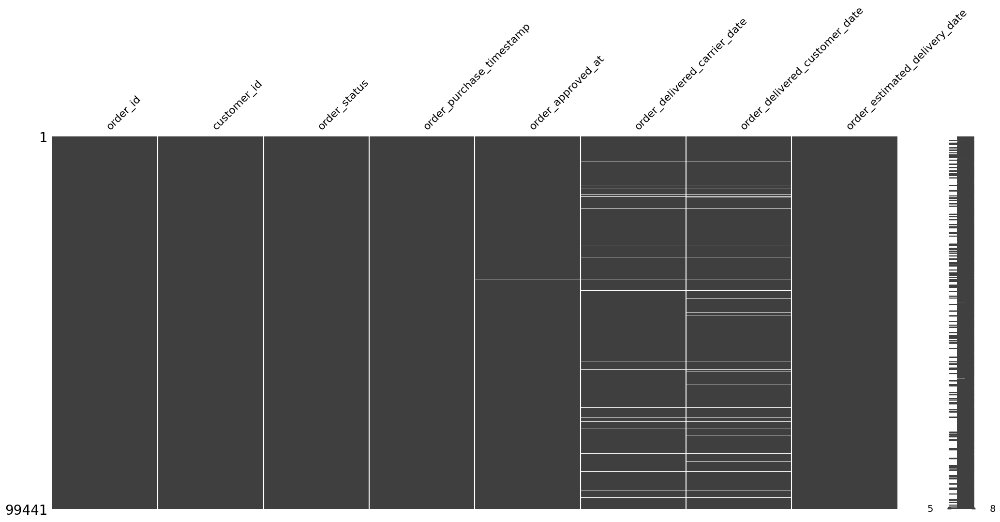

In [5]:
msno.matrix(orders)

#### Histogrammes du noumbre de commandes par mois

In [6]:
# Convertir en format datetime
orders['order_purchase_timestamp'] = pd.to_datetime(orders['order_purchase_timestamp'])


# Ajouter une colonne 'année-mois'
orders['year_month'] = orders['order_purchase_timestamp'].dt.to_period('M').astype(str)

# Compter les commandes par mois
monthly_counts = orders['year_month'].value_counts().reset_index()
monthly_counts.columns = ['year_month', 'order_count']
monthly_counts = monthly_counts.sort_values('year_month')

# Créer un histogramme avec Plotly
fig = px.bar(
    monthly_counts,
    x='year_month',
    y='order_count',
    title='Histogramme des commandes par mois',
    labels={'year_month': 'Année-Mois', 'order_count': 'Nombre de commandes'},
    text='order_count'
)

# Afficher l'histogramme
fig.show()


### Customers

In [7]:
customers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
index,,,,,
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [8]:
customers.describe()

,customer_zip_code_prefix
count,99441.000000
mean,35137.474583
std,29797.938996
min,1003.000000
25%,11347.000000
50%,24416.000000
75%,58900.000000
max,99990.000000


<Axes: >

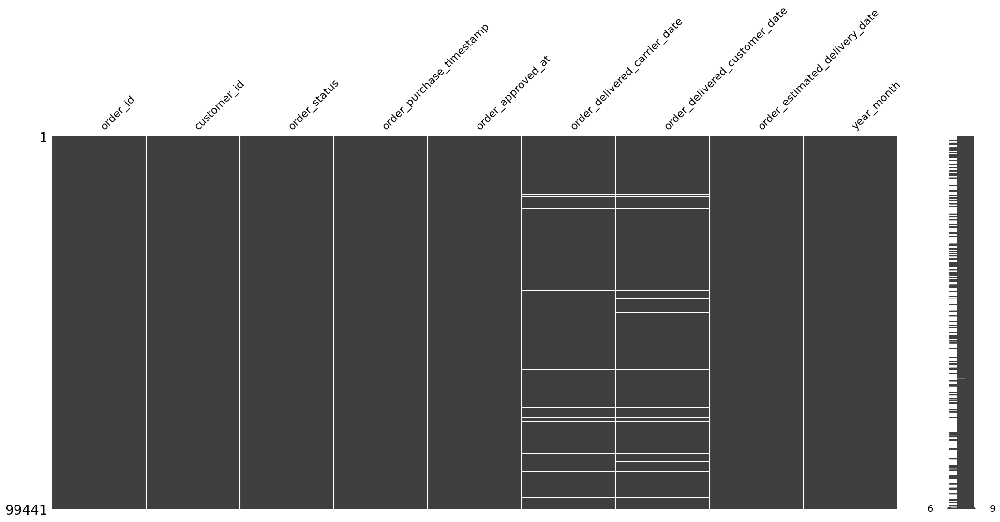

In [9]:
msno.matrix(orders)

In [10]:
customers.columns

Index(['customer_id', 'customer_unique_id', 'customer_zip_code_prefix',
       'customer_city', 'customer_state'],
      dtype='object')

#### Barchart du nombres de cleints par villes

In [11]:
grouped_customer_per_city = customers.groupby('customer_city')['customer_id'].count().reset_index()
grouped_customer_per_city.columns = ['customer_city', 'customer_count']

grouped_customer_per_city = grouped_customer_per_city.sort_values('customer_count', ascending=False)

fig = px.bar(
    grouped_customer_per_city[:10],
    y='customer_city',
    x='customer_count',
    title='Nombre de clients par Ville',
    labels={'customer_city': 'Ville', 'customer_count': 'Nombre de clients'},
    text='customer_count',
    color='customer_city',
    color_discrete_sequence=px.colors.qualitative.Vivid,
    orientation='h'
)
fig.show()

#### Barchart du nombre de client par etats

In [12]:
grouped_customer_per_state = customers.groupby('customer_state')['customer_id'].count().reset_index()
grouped_customer_per_state.columns = ['customer_state', 'customer_count']

grouped_customer_per_state = grouped_customer_per_state.sort_values('customer_count', ascending=False)

fig = px.bar(
    grouped_customer_per_state[:10],
    y='customer_state',
    x='customer_count',
    title='Nombre de clients par Etat',
    labels={'customer_state': 'Etat', 'customer_count': 'Nombre de clients'},
    text='customer_count',
    color='customer_state',
    color_discrete_sequence=px.colors.qualitative.Vivid,
    orientation='h'
)
fig.show()

#### Treemap du nombre de client par villes

In [13]:
fig = px.treemap(
    grouped_customer_per_city[:30],
    path=['customer_city'],
    values='customer_count',
    title='Treemap du nombre de clients par Ville',
    color='customer_count',
    color_continuous_scale='Viridis'
)
fig.show()

### Order Items

In [14]:
order_items.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
index,,,,,,,
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [15]:
order_items.describe()

,order_item_id,price,freight_value
count,112650.000000,112650.000000,112650.000000
mean,1.197834,120.653739,19.990320
std,0.705124,183.633928,15.806405
min,1.000000,0.850000,0.000000
25%,1.000000,39.900000,13.080000
50%,1.000000,74.990000,16.260000
75%,1.000000,134.900000,21.150000
max,21.000000,6735.000000,409.680000


<Axes: >

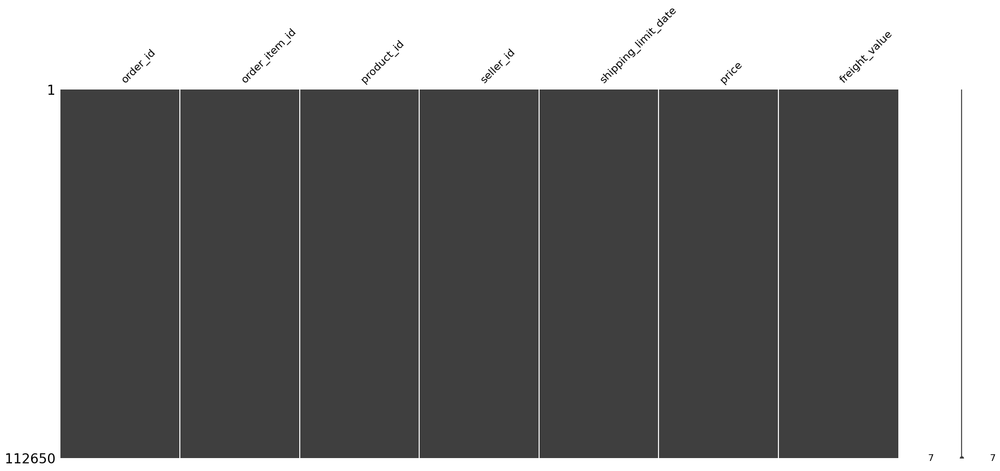

In [16]:
msno.matrix(order_items)

In [17]:
order_items.columns

Index(['order_id', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value'],
      dtype='object')

#### Boxplot des produit en fonction du prix

In [18]:
# Distribution des produits en fonction du prix
fig = px.box(order_items, x='price', title='Distribution des prix des produits')
fig.show()


#### Scatter plot comparatif du prix par rapport au fret

In [19]:
# Coparaison du prix du produit par rapport au fret
fig = px.scatter(order_items, x='price', y='freight_value', title='Prix VS Fret')
fig.show()


### Order Reviews

In [20]:
order_reviews.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
index,,,,,,,
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,None,None,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,None,None,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,None,None,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,None,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,None,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


In [21]:
order_reviews.describe()

,review_score
count,99224.000000
mean,4.086421
std,1.347579
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


<Axes: >

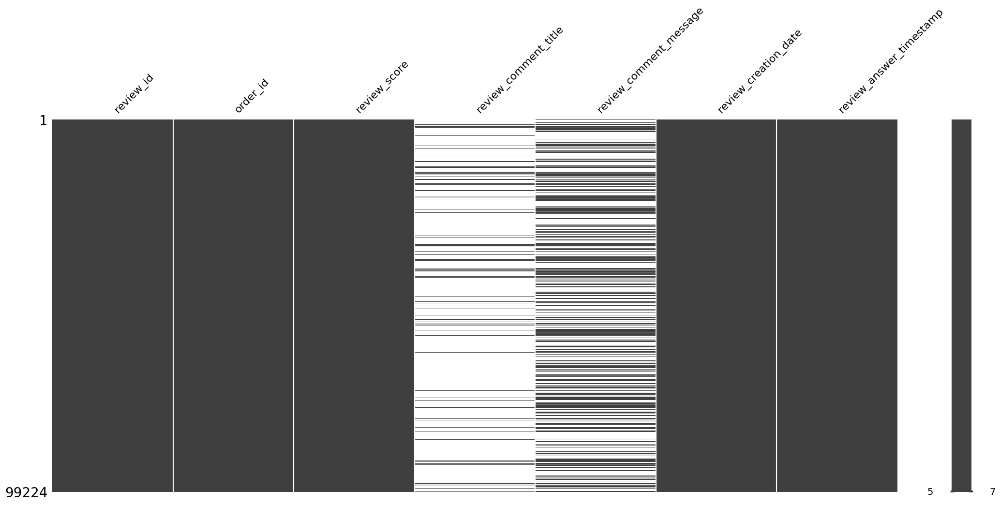

In [22]:
msno.matrix(order_reviews)

#### Piechart de la distributions des notes des reviexs

In [23]:
import plotly.express as px

# Calculer la fréquence de chaque score de révision
score_counts = order_reviews['review_score'].value_counts().reset_index()
score_counts.columns = ['review_score', 'count']

# Tracer le diagramme circulaire
fig = px.pie(score_counts, values='count', names='review_score', title='Distribution des notes')
fig.show()


#### Histogramme des notes moyennes par mois

In [24]:
# Assurez-vous que la colonne 'review_creation_date' est de type datetime
order_reviews['review_creation_date'] = pd.to_datetime(order_reviews['review_creation_date'])

# Extraire le mois et l'année de la date de création de la révision
order_reviews['month_year'] = order_reviews['review_creation_date'].dt.to_period('M').astype(str)

# Calculer le nombre de chaque score de révision (1, 2, 3, 4, 5) pour chaque mois
score_counts = order_reviews.groupby(['month_year', 'review_score']).size().reset_index(name='count')

# Tracer le graphique en barres empilées
fig = px.bar(
    score_counts, x='month_year', y='count', color='review_score',
    title='Distribution des notes par mois',
    labels={'month_year': 'Mois', 'count': 'Nombre de scores', 'review_score': 'Score de révision'},
    barmode='stack'
    )

fig.show()


### Products

In [25]:
products.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
index,,,,,,,,,
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [26]:
products.describe()

,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
count,32341.000000,32341.000000,32341.000000,32949.000000,32949.000000,32949.000000,32949.000000
mean,48.476949,771.495285,2.188986,2276.472488,30.815078,16.937661,23.196728
std,10.245741,635.115225,1.736766,4282.038731,16.914458,13.637554,12.079047
min,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000
25%,42.000000,339.000000,1.000000,300.000000,18.000000,8.000000,15.000000
50%,51.000000,595.000000,1.000000,700.000000,25.000000,13.000000,20.000000
75%,57.000000,972.000000,3.000000,1900.000000,38.000000,21.000000,30.000000
max,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000


<Axes: >

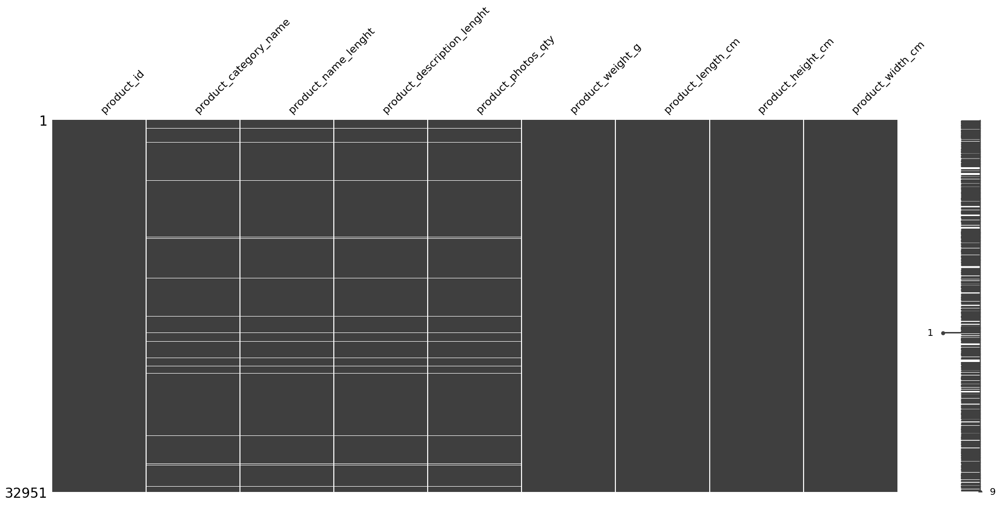

In [27]:
msno.matrix(products)

In [28]:
products.columns

Index(['product_id', 'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm'],
      dtype='object')

#### Piechart de la distribution des categories de produits

In [29]:
import pandas as pd
import plotly.express as px

# Compter les occurrences de chaque catégorie
category_counts = products['product_category_name'].value_counts().reset_index()
category_counts.columns = ['product_category_name', 'count']

# Calculer la proportion de chaque catégorie
category_counts['proportion'] = category_counts['count'] / category_counts['count'].sum()

# Séparer les catégories avec plus de 5% et regrouper les autres
main_categories = category_counts[category_counts['proportion'] > 0.05]
other_categories = category_counts[category_counts['proportion'] <= 0.05]

# Ajouter une ligne "Autre" avec la somme des catégories restantes
other_row = pd.DataFrame([{
    'product_category_name': 'Autre',
    'count': other_categories['count'].sum(),
    'proportion': other_categories['proportion'].sum()
}])

# Combiner les catégories principales et la ligne "Autre"
final_categories = pd.concat([main_categories, other_row])

# Créer le graphique en secteurs
fig = px.pie(final_categories, names='product_category_name', values='count',
             title="Répartition des catégories de produits",
             labels={'product_category_name': 'Catégorie', 'count': 'Nombre'})
fig.show()


#### Matrice de correlation entre la largeur, hauteur, le poid ....

In [30]:
import pandas as pd
import plotly.figure_factory as ff

# Calculer la matrice de corrélation et arrondir les valeurs
corr = products[['product_name_lenght', 'product_description_lenght', 'product_photos_qty',
                 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm']].corr()
corr_rounded = corr.round(2)

# Créer la heatmap annotée
fig = ff.create_annotated_heatmap(z=corr_rounded.values, 
                                  x=list(corr_rounded.columns), 
                                  y=list(corr_rounded.columns),
                                  annotation_text=corr_rounded.values,
                                  colorscale='Viridis', 
                                  showscale=True)

fig.update_layout(title="Matrice de corrélation")
fig.show()


### Sellers

In [31]:
sellers.head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state
index,,,,
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


In [32]:
sellers.describe()

,seller_zip_code_prefix
count,3095.000000
mean,32291.059451
std,32713.453830
min,1001.000000
25%,7093.500000
50%,14940.000000
75%,64552.500000
max,99730.000000


<Axes: >

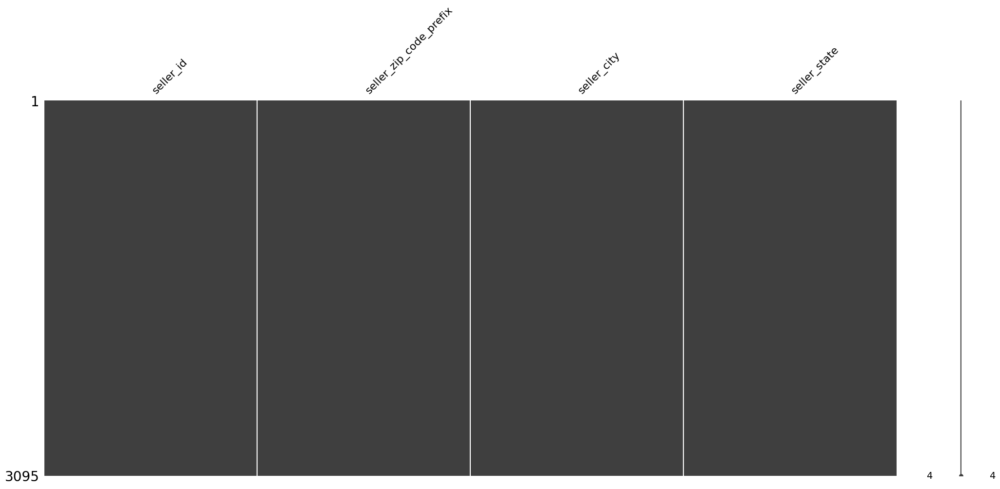

In [33]:
msno.matrix(sellers)

In [34]:
sellers.columns

Index(['seller_id', 'seller_zip_code_prefix', 'seller_city', 'seller_state'], dtype='object')

### Translation

In [35]:
translation.product_category_name.shape

(71,)

In [36]:
products.product_category_name.shape

(32951,)

### Geolocalisation

In [37]:
geoloc.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
index,,,,,
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


<Axes: >

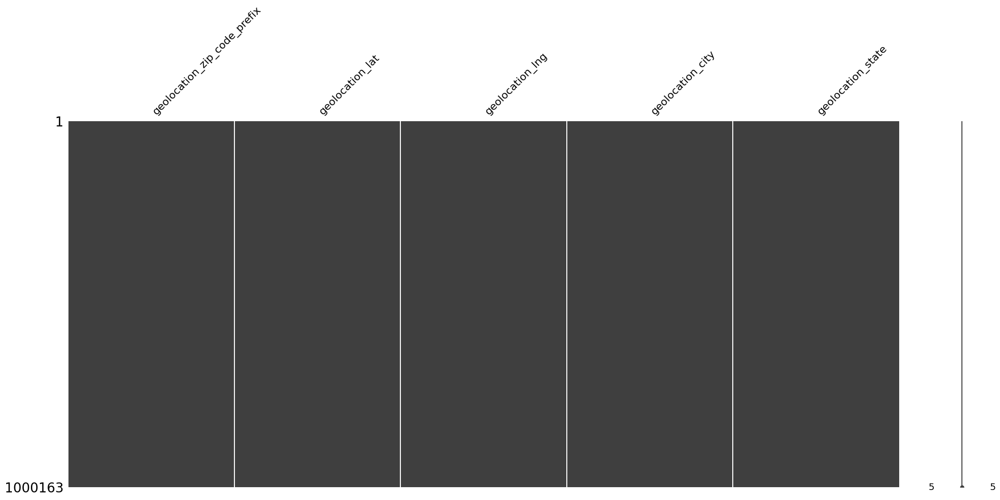

In [38]:
msno.matrix(geoloc)

## Etude naive des dataframe sous forme concatener par pertinence

### Analyser le rapport clients / commandes
Tables à fusionner -> customers ↔ orders (customer_id)

Pourquoi ?  -> Comprendre le comportement des clients : combien de commandes un client effectue, les délais de livraison, et l’état des commandes.

In [39]:
# Jointure entre customers et orders
customers_orders = pd.merge(customers, orders, on="customer_id", how="inner")
customers_orders.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,year_month
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05 00:00:00,2017-05
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-15 17:14:59,2018-01-29 12:41:19,2018-02-06 00:00:00,2018-01
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,delivered,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-11 14:31:00,2018-06-14 17:58:51,2018-06-13 00:00:00,2018-05
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,951670f92359f4fe4a63112aa7306eba,delivered,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-27 23:22:42,2018-03-28 16:04:25,2018-04-10 00:00:00,2018-03
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,delivered,2018-07-29 09:51:30,2018-07-29 10:10:09,2018-07-30 15:16:00,2018-08-09 20:55:48,2018-08-15 00:00:00,2018-07


In [40]:
# Calcul du nombre de commande/client
count_orders = customers_orders.groupby('customer_unique_id').size().reset_index(name='count_orders') 

# transformation en categorie du nombre de commande par client
count_orders['order_category'] = pd.cut(
    count_orders['count_orders'],
    bins=[0, 1, 2, 5, 10, float("inf")], 
    labels=["1 commande", "2 commandes", "3-5 commandes", "6-10 commandes", "> 10 commandes"],
    right=True
)

count_orders['order_category'].value_counts()


order_category
1 commande        93099
2 commandes        2745
3-5 commandes       241
6-10 commandes       10
> 10 commandes        1
Name: count, dtype: int64

In [ ]:
# Calcul des pourcentages
order_category_distribution = count_orders["order_category"].value_counts(normalize=True).reset_index()
order_category_distribution.columns = ["order_category", "percentage"]
order_category_distribution["percentage"] *= 100  

# Pie Chart
fig1 = px.pie(order_category_distribution, 
              names="order_category", 
              values="percentage",
              title="",
              labels={"order_category": "Catégorie de commandes", "percentage": "Pourcentage"},
              color_discrete_sequence=px.colors.sequential.Viridis)
fig1.update_traces(textinfo="percent+label")
fig1.show()

In [42]:
# Nombre de commandes par ville
orders_by_city = customers_orders.groupby("customer_city").size().reset_index(name="order_count")

# Trier les villes par nombre de commandes (top 10)
orders_by_city = orders_by_city.sort_values("order_count", ascending=False).head(10)

# Bar chart
fig3 = px.bar(orders_by_city, x="customer_city", y="order_count",
              title="Top 10 des villes avec le plus de commandes",
              labels={"customer_city": "Ville", "order_count": "Nombre de commandes"},
              color="order_count",
              color_continuous_scale="Viridis")
fig3.update_layout(xaxis_title="Ville", yaxis_title="Nombre de commandes", xaxis_tickangle=45)
fig3.show()


### Analyser les produits achetés / performance
Analyser les produits achetés et leur performance

In [43]:
# Fusion des tables `order_items` et `products` sur `product_id`
order_items_products = pd.merge(order_items, products, on='product_id', how='inner')

# Fusion des résultats avec `orders` sur `order_id`
full_data = pd.merge(order_items_products, orders, on='order_id', how='inner')


In [44]:
import plotly.express as px

# Calculer le nombre d'articles vendus par catégorie
category_sales = full_data.groupby('product_category_name').size().reset_index(name='sales_count')

# Trier les catégories par nombre de ventes
category_sales_sorted = category_sales.sort_values(by='sales_count', ascending=False)

# Créer le bar chart
fig = px.bar(category_sales_sorted[:10], 
             x='product_category_name', 
             y='sales_count', 
             title="Top des catégories de produits les plus vendues",
             labels={'product_category_name': 'Catégorie de produit', 'sales_count': 'Nombre de ventes'},
             color='sales_count')

# Afficher le graphique
fig.show()


- Cama mesa banho -> Lit et salle de bain
- beleza saude -> beauté santé
- esporte lazer -> sport loisirs
- moveis decorado -> decoration film
- informatica acessorios -> accessoire informatiques
- utilidades domesticas -> produit domestiques
- relogios presentes -> cadeaux horlogers
- telefonia -> telephonie
- ferramentas jardim -> outils de jardin
- automotivo -> automobile

In [45]:
# Créer le box plot pour analyser la distribution des prix par catégorie de produit
fig = px.box(full_data, 
             x='product_category_name', 
             y='price', 
             title="Distribution des prix des produits par catégorie",
             labels={'product_category_name': 'Catégorie de produit', 'price': 'Prix du produit'},            
             )

# Afficher le graphique
fig.show()


### Analyser les paiements et leur impact

In [46]:
# Fusionner sur la colonne 'order_id'
impact_pymt = pd.merge(orders, order_pymts, on='order_id', how='inner')

# Afficher les premières lignes pour vérifier
impact_pymt.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,year_month,payment_sequential,payment_type,payment_installments,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,2017-10,1,credit_card,1,18.12
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,2017-10,3,voucher,1,2.00
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,2017-10,2,voucher,1,18.59
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,2018-07,1,boleto,1,141.46
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,2018-08,1,credit_card,3,179.12


In [47]:
# Compter le nombre de chaque type de paiement
payment_counts = impact_pymt['payment_type'].value_counts()

# Créer un graphique à secteurs
fig1 = px.pie(payment_counts, values=payment_counts.values, names=payment_counts.index,
              title='Répartition des types de paiements')
fig1.show()


In [48]:
# Créer un box plot pour la distribution des paiements par type
fig2 = px.box(impact_pymt, x='payment_type', y='payment_value',
              title='Distribution des paiements par type de paiement',
              labels={'payment_type': 'Type de paiement', 'payment_value': 'Valeur du paiement'})
fig2.show()


In [49]:
import plotly.express as px

# Agréger la somme des paiements par statut de commande
payment_by_status = impact_pymt.groupby('order_status')['payment_value'].sum().reset_index()

# Créer un graphique à secteurs
fig4_pie = px.pie(payment_by_status, names='order_status', values='payment_value',
                  title='Répartition des paiements par statut de commande',
                  labels={'order_status': 'Statut de la commande', 'payment_value': 'Montant total payé'})
fig4_pie.show()


### Analyse vendeur / ventes

In [50]:
# Fusionner les DataFrames
sell_seller = pd.merge(order_items, sellers, on='seller_id')
sell_seller = pd.merge(sell_seller, products, on='product_id')

In [51]:
# Calculer le nombre de ventes par vendeur
sales_by_seller = sell_seller.groupby('seller_id').size().reset_index(name='sales_count')

# Trier les vendeurs par nombre de ventes
sales_by_seller_sorted = sales_by_seller.sort_values(by='sales_count', ascending=False).head(10)

# Création du bar chart
fig = px.bar(sales_by_seller_sorted, x='seller_id', y='sales_count', title='Top 10 des vendeurs ayant le plus de ventes',
             labels={'seller_id': 'Vendeur', 'sales_count': 'Nombre de ventes'})
fig.show()


In [52]:
# Calculer le nombre de produits vendus et le prix moyen par produit
product_sales = sell_seller.groupby('product_id').agg(
    total_sales=('order_item_id', 'count'),
    avg_price=('price', 'mean')
).reset_index()

# Créer un graphique en nuage de points
fig = px.scatter(product_sales, x='total_sales', y='avg_price', title='Relation entre le nombre de produits vendus et leur prix moyen',
                 labels={'total_sales': 'Nombre de produits vendus', 'avg_price': 'Prix moyen'})
fig.show()


# Feature Engineering

## Feature RFM

RFM (Récence, Fréquence, Montant) est une méthode de segmentation des clients basée sur trois dimensions clés :

    Récence (R) : Le temps écoulé depuis la dernière commande du client.
    Fréquence (F) : Le nombre total de commandes passées par le client.
    Montant (M) : Le montant total dépensé par le client.


In [53]:
# Recuperer la derniere date d'achat du df ici 2018-10-17 17:30:18
reference_date = orders["order_purchase_timestamp"].max()

### Récence (R) : Le temps écoulé depuis la dernière commande du client.

On récupère la dernière date d'achat de chaque customer_id et on calcule la R en soustrayant cette date la date la plus recente.

In [54]:
recency_df_origin = pd.merge(customers, orders, on="customer_id", how="inner")

In [55]:
# Trouver la dernière date d'achat pour chaque client
recency_df = recency_df_origin.groupby("customer_unique_id")["order_purchase_timestamp"].max().reset_index()

# Calculer R (date ref - plus vielle commande par cleint)
recency_df["R"] = (reference_date - recency_df["order_purchase_timestamp"]).dt.days

recency_df.head()

,customer_unique_id,order_purchase_timestamp,R
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,160
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,163
2,0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,585
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,369
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,336


In [56]:
alternative_recency_df = recency_df.copy()

bins = [0, 7, 30, 90, 365, float("inf")]  
labels = ["<1Week", "> 1Week", "> 1Month ", "> 3Month", "> 1Year"]

# Appliquer la catégorisation
alternative_recency_df["Recency_Category"] = pd.cut(alternative_recency_df["R"], bins=bins, labels=labels, right=False)

alternative_recency_df.head()

,customer_unique_id,order_purchase_timestamp,R,Recency_Category
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,160,> 3Month
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,163,> 3Month
2,0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,585,> 1Year
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,369,> 1Year
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,336,> 3Month


### Fréquence (F) : Le nombre total de commandes passées par le client.

ORDER: Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
'order_approved_at', 'order_delivered_carrier_date',
'order_delivered_customer_date', 'order_estimated_delivery_date',
'year_month'],
dtype='object')

ORDER_ITEMS:Index(['order_id', 'order_item_id', 'product_id', 'seller_id',
'shipping_limit_date', 'price', 'freight_value'],
dtype='object')



In [57]:
# Concat entre customers et orders
frequency_df = pd.merge(customers, orders, on="customer_id", how="inner")

# Calcul du nombre de commande/client
frequency_df = frequency_df.groupby('customer_unique_id').size().reset_index(name='F')

frequency_df.head()

,customer_unique_id,F
0,0000366f3b9a7992bf8c76cfdf3221e2,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1
2,0000f46a3911fa3c0805444483337064,1
3,0000f6ccb0745a6a4b88665a16c9f078,1
4,0004aac84e0df4da2b147fca70cf8255,1


In [58]:
alternative_frequency_df = frequency_df.copy()

# transformation en categorie du nombre de commande par client
alternative_frequency_df['Frequency_Category'] = pd.cut(
    count_orders['count_orders'],
    bins=[0, 1, 2, 5, 10, float("inf")], 
    labels=["1", "<3", "<5", "<9", ">10"],
    right=True
)

alternative_frequency_df.sample(5)

,customer_unique_id,F,Frequency_Category
66066,af9b68704fe49cb7b9b5687732ac8488,1,1
267,00b0d21952ae29dfe79db614512a27c2,1,1
87247,e829d4dd2a59a06118e8a69a9a5f403c,1,1
40809,6c5e580c237df66c21d27990335fe7f8,1,1
81367,d88c6d8c0caed386e83167dc6c448dc9,1,1


### Montant (M) : Le montant total dépensé par le client.

In [59]:
freq_df = pd.merge(customers, orders, on="customer_id", how="inner")
amount_df = pd.merge(freq_df, order_pymts, on='order_id', how='inner')

# Calcul du montant total dépensé par client unique
amount_df = amount_df.groupby("customer_unique_id")["payment_value"].sum().reset_index()

# Renommer la colonne en "M"
amount_df.rename(columns={"payment_value": "M"}, inplace=True)

amount_df.head()


,customer_unique_id,M
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19
2,0000f46a3911fa3c0805444483337064,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,43.62
4,0004aac84e0df4da2b147fca70cf8255,196.89


In [60]:
# Afficher la median du montant depenser par les clients
amount_df['M'].describe()

count    96095.000000
mean       166.594226
std        231.428912
min          0.000000
25%         63.120000
50%        108.000000
75%        183.530000
max      13664.080000
Name: M, dtype: float64

In [61]:
df_RF = pd.merge(recency_df.drop('order_purchase_timestamp', axis=1), frequency_df, on='customer_unique_id', how='inner')

df_RF.head()

,customer_unique_id,R,F
0,0000366f3b9a7992bf8c76cfdf3221e2,160,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,163,1
2,0000f46a3911fa3c0805444483337064,585,1
3,0000f6ccb0745a6a4b88665a16c9f078,369,1
4,0004aac84e0df4da2b147fca70cf8255,336,1


In [62]:
df_RFM = pd.merge(df_RF, amount_df, on='customer_unique_id', how='inner')

df_RFM.head()

,customer_unique_id,R,F,M
0,0000366f3b9a7992bf8c76cfdf3221e2,160,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,163,1,27.19
2,0000f46a3911fa3c0805444483337064,585,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,369,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,336,1,196.89


In [63]:
def rfm_segment(row):
    if row['R'] <= 60 and row['F'] > 2 and row['M'] > 200:
        return 'Champions'
    elif row['R'] <= 60 and row['F'] > 2:
        return 'Loyaux'
    elif row['R'] > 60 and row['R'] <= 180 and row['F'] > 1:
        return 'Loyalistes potentiels'
    elif row['R'] > 60 and row['R'] <= 180:
        return 'À réactiver'
    elif row['F'] == 1 and row['R'] > 180:
        return 'Perdus'
    else:
        return 'À risque'

# Appliquer la fonction
df_RFM['Segment'] = df_RFM.apply(rfm_segment, axis=1)


In [64]:
import pandas as pd
import plotly.express as px

# Définir un ordre spécifique pour les segments
segment_order = ['Champions', 'Loyaux', 'Loyalistes potentiels', 'À réactiver', 'À risque', 'Perdus']

# Appliquer l'ordre des segments dans le DataFrame
df_RFM['Segment'] = pd.Categorical(df_RFM['Segment'], categories=segment_order, ordered=True)

# Compter les clients par segment
segment_count = df_RFM['Segment'].value_counts().reset_index()
segment_count.columns = ['Segment', 'Count']

# Créer une carte RFM
fig = px.treemap(
    segment_count,
    path=['Segment'], 
    values='Count',
    title="Segmentation RFM des Clients",
    color='Count',  # Couleur basée sur le nombre de clients
    color_continuous_scale='Viridis'
)

fig.show()



c:\Users\vuill\OneDrive\Documents\GitHub\OpenClassrooms\Projet 5 - Segmentez des clients d'un site e-commerce\.venv_p5\Lib\site-packages\plotly\express\_core.py:1727: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



## Creations de 2 autres features pour le rfm

### Satisfaction : Calcul de métriques satisfaction client basées sur les commentaires.

In [65]:
order_reviews.columns

Index(['review_id', 'order_id', 'review_score', 'review_comment_title',
       'review_comment_message', 'review_creation_date',
       'review_answer_timestamp', 'month_year'],
      dtype='object')

In [66]:
customers.columns

Index(['customer_id', 'customer_unique_id', 'customer_zip_code_prefix',
       'customer_city', 'customer_state'],
      dtype='object')

In [67]:
customers_orders_df = pd.merge(customers, orders, on="customer_id", how="inner")
satisfaction_df = pd.merge(customers_orders_df, order_reviews, on="order_id", how="inner").drop(list(orders.columns), axis=1)

In [68]:
satisfaction_df.columns

Index(['customer_unique_id', 'customer_zip_code_prefix', 'customer_city',
       'customer_state', 'review_id', 'review_score', 'review_comment_title',
       'review_comment_message', 'review_creation_date',
       'review_answer_timestamp', 'month_year'],
      dtype='object')

In [69]:
# Calcul du montant total dépensé par client unique
satisfaction_df = satisfaction_df.groupby("customer_unique_id")["review_score"].sum().reset_index()

# Renommer la colonne en "M"
satisfaction_df.rename(columns={"review_score": "S"}, inplace=True)

satisfaction_df.head()

,customer_unique_id,S
0,0000366f3b9a7992bf8c76cfdf3221e2,5
1,0000b849f77a49e4a4ce2b2a4ca5be3f,4
2,0000f46a3911fa3c0805444483337064,3
3,0000f6ccb0745a6a4b88665a16c9f078,4
4,0004aac84e0df4da2b147fca70cf8255,5


In [70]:
df_RFML = pd.merge(df_RFM.drop('Segment', axis=1), satisfaction_df, on="customer_unique_id", how="inner" )

### Localisation : Creation de features basées sur la localisation des clients (par exemple, région, ville).

In [71]:
localisation_df = customers.groupby("customer_unique_id")["customer_city"].sum().reset_index()

# Renommer la colonne en "M"
localisation_df.rename(columns={"customer_city": "L"}, inplace=True)


localisation_df.head()

,customer_unique_id,L
0,0000366f3b9a7992bf8c76cfdf3221e2,cajamar
1,0000b849f77a49e4a4ce2b2a4ca5be3f,osasco
2,0000f46a3911fa3c0805444483337064,sao jose
3,0000f6ccb0745a6a4b88665a16c9f078,belem
4,0004aac84e0df4da2b147fca70cf8255,sorocaba


In [72]:
df_RFMLS = pd.merge(df_RFML, localisation_df, on="customer_unique_id", how="inner" )

# Finals dataframe

In [ ]:
# df_RFMLS.csv('RFMLS.csv')

df_RFMLS.head()

AttributeError: 'DataFrame' object has no attribute 'csv'

In [ ]:
df_RFM.csv('RFM.xlsx').drop('Segment', axis=1)

df_RFM.head()

,customer_unique_id,R,F,M,Segment
0,0000366f3b9a7992bf8c76cfdf3221e2,160,1,141.90,À réactiver
1,0000b849f77a49e4a4ce2b2a4ca5be3f,163,1,27.19,À réactiver
2,0000f46a3911fa3c0805444483337064,585,1,86.22,Perdus
3,0000f6ccb0745a6a4b88665a16c9f078,369,1,43.62,Perdus
4,0004aac84e0df4da2b147fca70cf8255,336,1,196.89,Perdus
